In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import wandb
from ydata_profiling import ProfileReport

# First set up our Weights and Biases run to save the execution of this notebook

In [2]:
run = wandb.init(
    project="nyc_airbnb",
    save_code=True
)

wandb: Currently logged in as: culv. Use `wandb login --relogin` to force relogin


# Next pull the latest raw data from Weights and Biases, load it into a dataframe and take a look

In [3]:
artifact = run.use_artifact("sample.csv:latest")
df = pd.read_csv(artifact.file())
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,9138664,Private Lg Room 15 min to Manhattan,47594947,Iris,Queens,Sunnyside,40.74271,-73.92493,Private room,74,2,6,2019-05-26,0.13,1,5
1,31444015,TIME SQUARE CHARMING ONE BED IN HELL'S KITCHEN...,8523790,Johlex,Manhattan,Hell's Kitchen,40.76682,-73.98878,Entire home/apt,170,3,0,NaN,NaN,1,188
2,8741020,Voted #1 Location Quintessential 1BR W Village...,45854238,John,Manhattan,West Village,40.73631,-74.00611,Entire home/apt,245,3,51,2018-09-19,1.12,1,0
3,34602077,Spacious 1 bedroom apartment 15min from Manhattan,261055465,Regan,Queens,Astoria,40.76424,-73.92351,Entire home/apt,125,3,1,2019-05-24,0.65,1,13
4,23203149,Big beautiful bedroom in huge Bushwick apartment,143460,Megan,Brooklyn,Bushwick,40.69839,-73.92044,Private room,65,2,8,2019-06-23,0.52,2,8


# Profile the dataframe so we can explore the data

In [4]:
profile = ProfileReport(
    df,
    title="NYC Airbnb Report",
    explorative=True,
    config_file="" # error is thrown if config file isnt provided since default is None but profiler expects str or Path
)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Lets take a closer look at prices
If we look at a histogram we can see there are several Airbnb's that are \\$0 per night, as well as one that is \\$10,000 per night

Max Airbnb price: 10000
Min Airbnb price: 0
Number of Airbnb's at 10000: 1
Number of Airbnb's at 0: 5


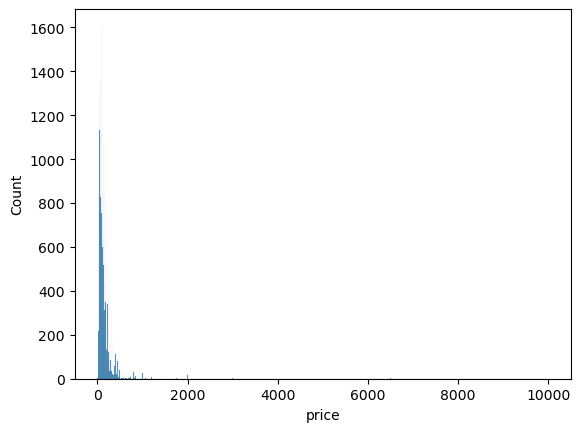

In [5]:
counts = df["price"].value_counts(sort=True)
max_price = df["price"].max()
min_price = df["price"].min()

print(f"Max Airbnb price: {max_price}")
print(f"Min Airbnb price: {min_price}")

print(f"Number of Airbnb's at {max_price}: {counts[max_price]}")
print(f"Number of Airbnb's at {min_price}: {counts[min_price]}")

sns.histplot(df["price"])
plt.show()

# Lets filter out the price outliers
We'll only keep rows where price is between \\$10 and \\$350

In [6]:
min_price_filter = 10
max_price_filter = 350
print(f"{len(df)} rows before filtering price outliers")
keep_idx = df["price"].between(min_price_filter, max_price_filter)
df = df[keep_idx].copy()
print(f"{len(df)} rows after filtering price outliers")

20000 rows before filtering price outliers
19001 rows after filtering price outliers


# The last_review column also needs to be fixed
It is a string in the dataframe, but it should be a datetime

In [7]:
# Convert last_review to datetime
df['last_review'] = pd.to_datetime(df['last_review'])

# Lets re-profile the dataframe and take another final look
There are still missing values but we can impute those in our pipeline

In [8]:
profile = ProfileReport(
    df,
    title="NYC Airbnb Report",
    explorative=True,
    config_file="" # error is thrown if config file isnt provided since default is None but profiler expects str or Path
)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
run.finish()